In [2]:
import math
import cv2
from scipy import signal
import numpy as np
import os
import matplotlib.pyplot as plt 
import cv2
from matplotlib import cm
import random

# Optical flow - Ajay Shrihari
- This is the implementation of Lucas Kanade Tracker for Optical flow
- This approach does not use the Gaussian pyramidal structure
- We use the assumption that the brightness is constant across the image
- We try to solve the following equation : Fx.u + Fy.v + Ft = 0
    - Fx is derivative in x direction
    - Fy is derivative in y direction
    - Ft is derivative wrt time
- Least squares minimization can be used to solve the equation
- For sparse optical flow, we consider only the corner points using the Shi Tomasi equation.

In [3]:
def frames(dataname = "Backyard"):
    '''
    Function to output frames from the Middleburry vision dataset
    '''
    dir_ = "../eval-data-gray"
    img1 = cv2.imread(dir_ + "/" + dataname + "/frame10.png")
    img2 = cv2.imread(dir_ + "/" + dataname + "/frame11.png")
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    return img1, img2

In [34]:
def calculate_derivative(img):
    '''
    Function to calculate image derivatives in the x, y and xy direction
    '''
#     img = np.array(img)
#     print (img.shape)
    filter_x =  [[-1,1],[-1,1]]
    filter_y =  [[-1,-1],[1,1]]
    filter_xy = [[0.25,0.25],[0.25,0.25]]
    filter_x_img = signal.convolve2d(img, filter_x, 'same', boundary = 'symm')
    filter_y_img = signal.convolve2d(img, filter_y, 'same', boundary = 'symm')
    filter_xy_img = signal.convolve2d(img, filter_xy, 'same', boundary = 'symm')
    return filter_x_img, filter_y_img, filter_xy_img

In [5]:
def calculate_fx_fy_ft(img1, img2):
    '''
    Function to calculate fx, fy and ft for optical flow equation
    '''
#     img1 = cv2.blur(img1, (2,2))
#     img2 = cv2.blur(img2, (2,2))
    filter_x_img1, filter_y_img1, filter_xy_img1 = calculate_derivative(img1)
    filter_x_img2, filter_y_img2, filter_xy_img2 = calculate_derivative(img2)
    fx = filter_x_img1 
    fy = filter_y_img1 
    ft = filter_xy_img2 - filter_xy_img1
#     print (len(fx[:-1,0]))
    return fx, fy, ft

In [19]:
def arrow_plot(img1, img2, u, v, thresh):
    '''
    Function to plot optical flow in the form of arrows at each pixel
    '''
    plt.figure(figsize=(20,10))

    plt.imshow(img1, cmap= cm.gray)
    for i in range(img1.shape[0]):
        for j in range(img1.shape[1]):
            if abs(u[i,j])>thresh or abs(v[i,j])>thresh:
                plt.arrow(j,i,v[i,j]*3,u[i,j]*3,head_width = 5, head_length = 5, color = "b")
#                 plt.quiver(j, i, u[i, j], v[i, j], scale = 20, color = "b")
                

                
#     plt.show()

In [7]:
def least_square(Fx, Fy, Ft):
    '''
    Function to solve least squared minimization
    '''
    A = np.vstack((Fx,Fy))
    A_trans = np.transpose(A)
    U = np.matmul(A,A_trans)
#     print ("trans:", A_trans.shape)
#     print (U.shape)
    U = np.matmul(np.linalg.pinv(U), A)
#     print (U.shape)
#     print (np.array(Ft).shape)
    U = np.dot(U,-np.array(Ft))
    return U

In [33]:
def calculate_u_v(img1, img2, wsize = 2, type_ = "sparse"):
    '''
    Function to find u and v of optical flow
    '''
    wsize = wsize // 2
    img1_arr = np.array(img1)
#     u = np.zeros(img1.shape)
#     v = np.zeros(img1.shape)
    fx, fy, ft = calculate_fx_fy_ft(img1, img2)
    u = np.nan * np.ones(shape=(len(fx[:,0]),len(fx[0,:])))
    v = np.nan * np.ones(shape=(len(fx[:,0]),len(fx[0,:])))
#     img1_blur = cv2.GaussianBlur(img1, (3,3), 0)
    if type_ == "sparse":
        
        corner_feat = np.int0(cv2.goodFeaturesToTrack(np.array(img1_arr), 1000, 0.01, 10))
        for feat in corner_feat:
            j, i = feat.ravel()
            Fx = fx[i-wsize:i+wsize+1, j-wsize:j+wsize+1].flatten()
            Fy = fy[i-wsize:i+wsize+1, j-wsize:j+wsize+1].flatten()
            Ft = ft[i-wsize:i+wsize+1, j-wsize:j+wsize+1].flatten()
            U = least_square(Fx, Fy, Ft)
            (u[i,j],v[i,j]) = U
    #         print (u[i,j])
    #         print (v[i,j])
    #         print (u)
    #     print (u)
    #     print (v)
    if type_ == "dense":
        u = np.zeros(img1.shape)
        v = np.zeros(img1.shape)
        for i in range(wsize, img1.shape[0]-wsize):
            for j in range(wsize, img1.shape[0]-wsize):
                Fx = fx[i-wsize:i+wsize+1, j-wsize:j+wsize+1].flatten()
                Fy = fy[i-wsize:i+wsize+1, j-wsize:j+wsize+1].flatten()
                Ft = ft[i-wsize:i+wsize+1, j-wsize:j+wsize+1].flatten()
                U = least_square(Fx, Fy, Ft)
                (u[i,j],v[i,j]) = U
                
    return u, v

In [15]:
def mask_segmentation(u,v,img1,thresh=0.8):
  fig, axes = plt.subplots(figsize = (12, 12))
  mask = np.zeros_like(img1.shape)
  mag = u*u + v*v
  mask=(mag>thresh)
  axes.imshow(mask,cmap='gray')
  plt.show()
  return mask

In [24]:
def trackObjectsfromVid(path, out_path="object_out"):
    '''
    Function to track objects in a video
    Prints 1 frame for every 100 frames
    '''
    cap = cv2.VideoCapture(path)
    ret, frame1 = cap.read()
    prev_img = cv2.cvtColor(frame1,cv2.COLOR_BGR2GRAY)
    hsv = np.zeros_like(frame1)
    hsv[...,1] = 255
    i = 0
    while(1):
        if(i > 0 and i%30 == 0):
            break
        ret, frame2 = cap.read()
        if(ret is False):
            break
        next_img = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)
        if(i%3 == 0):
            u, v = calculate_u_v(prev_img,next_img, type_ = "dense",wsize = 24)
#             print (u.shape)
#             print (v.shape)
            mag, ang = cv2.cartToPolar(u, v)
#             print (mag)
#             print (ang)
            hsv[...,0] = ang*180/np.pi/2
            hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
            gray = cv2.cvtColor(cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB), cv2.COLOR_RGB2GRAY)
#             print (gray)
            thresh = cv2.threshold(gray, 25, 0xFF, cv2.THRESH_BINARY)[1]
            thresh = cv2.dilate(thresh, None, iterations=2)
            bgr = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)
            img_rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
            image, cnts, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
#             print (len(cnts))
            for c in cnts:
#                 print (c)
                (x, y, w, h) = cv2.boundingRect(c)
#                 print (h)
#                 print (w)
                if w > 15 and h > 15 and w < 900 and h < 680:
#                     print ("Enter")
                    cv2.rectangle(frame2, (x, y), (x + w, y + h), (0, 0xFF, 0), 4)
#             plt.figure(figsize=(20,10))
            plt.subplot(1,1,1)
            plt.axis('off')
#             plt.figure(figsize=(20,10))
            plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))
#             arrow_plot(frame1, frame2, u, v, thresh = 0.2)
            plt.savefig(out_path + "_" + str(i//100), pad_inches=0)
            plt.show()
        prev_img = next_img
        i += 1
    cap.release()
#     cv2.destroyAllWindows()

In [11]:
def segment_vid(path, out_path="new_out"):
    cap = cv2.VideoCapture(path)
    ret, frame1 = cap.read()
    prev_img = cv2.cvtColor(frame1,cv2.COLOR_BGR2GRAY)
    hsv = np.zeros_like(frame1)
    of=1
    hsv[...,1] = 255
    i = 0
    zf=i
    
    while(1):
        if(i > 0 and i%40 == 0):
            break
        ret, frame2 = cap.read()
        next_img = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY) 
        tf=True
        if(i%3 == 0 and tf):
            u, v = calculate_u_v(prev_img,next_img, type_ = "dense",wsize = 15)
            mask_segmentation(u,v,next_img)
        prev_img = next_img
        i += 1
    cap.release
    
    

In [12]:
def main(img1, img2, wsize = 2, thresh = 0.2, type_ = "sparse"):
#     img1 = img1/255
#     img2 = img2/255
    u, v = calculate_u_v(img1, img2, wsize = wsize, type_ = type_)
    arrow_plot(img1, img2, u, v, thresh)
    

### Sparse optical flow
- We do sparse optical flow by using only the corner points by using the Shi-Tomasi function.
- Then, we plot the optical flow by plotting the arrows, with the bottom at the pixel, and the head at the value of u and v at that pixel 

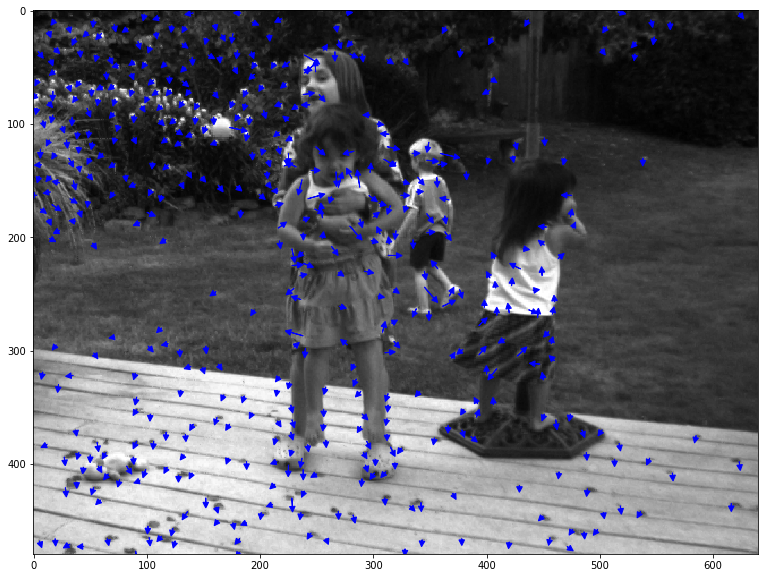

In [20]:
img1, img2 = frames()
main(img1, img2)

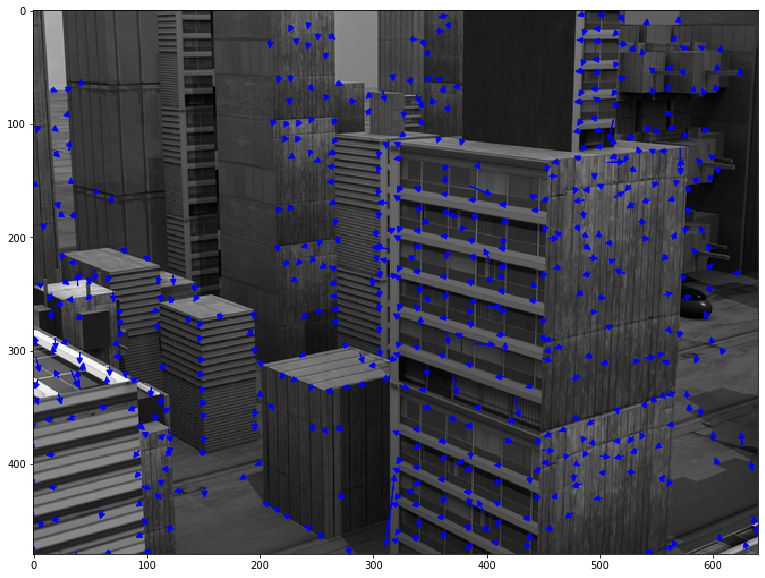

In [26]:
img1, img2 = frames("Urban")
main(img1, img2)

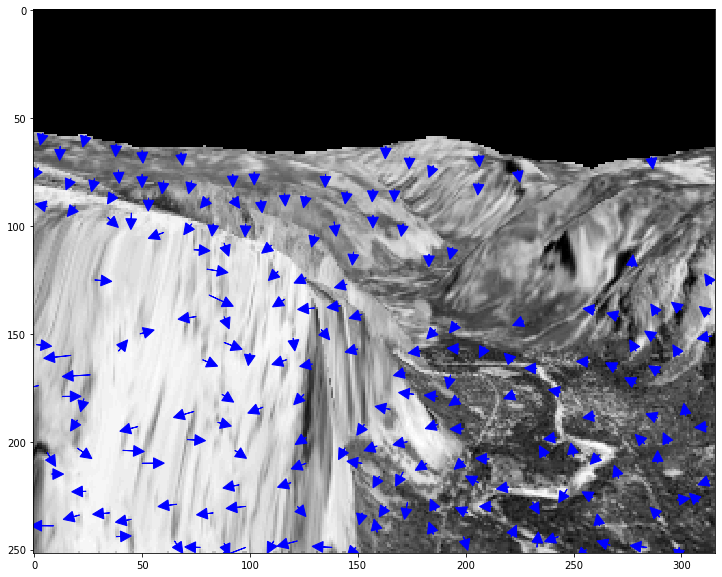

In [27]:
img1, img2 = frames("Yosemite")
main(img1, img2)

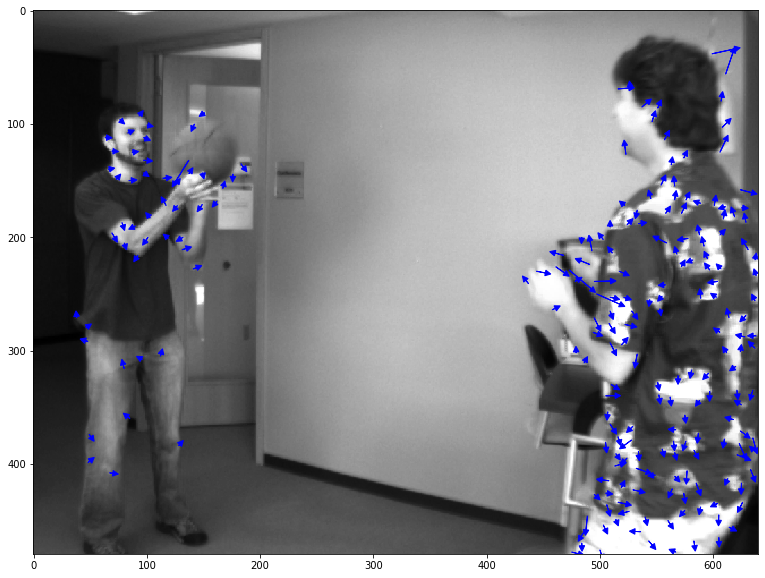

In [28]:
img1, img2 = frames("Basketball")
main(img1, img2)

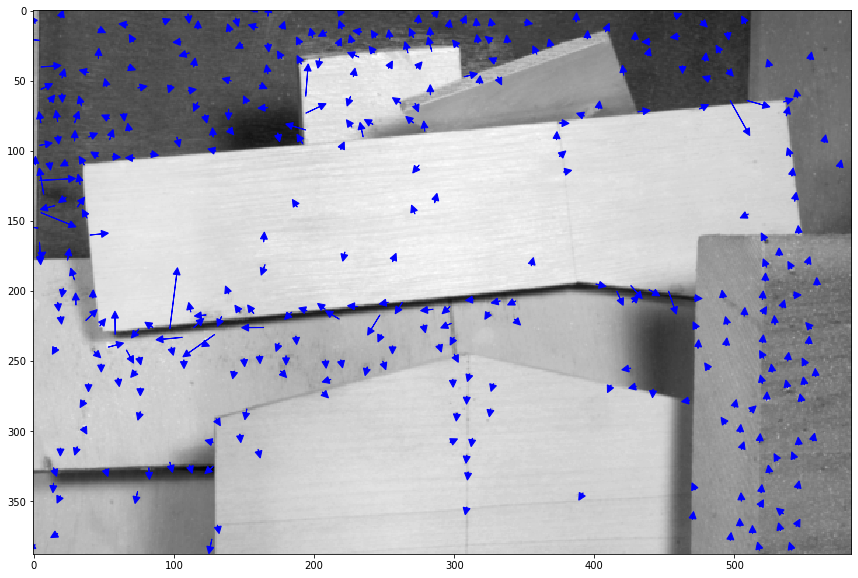

In [29]:
img1, img2 = frames("Wooden")
main(img1, img2)

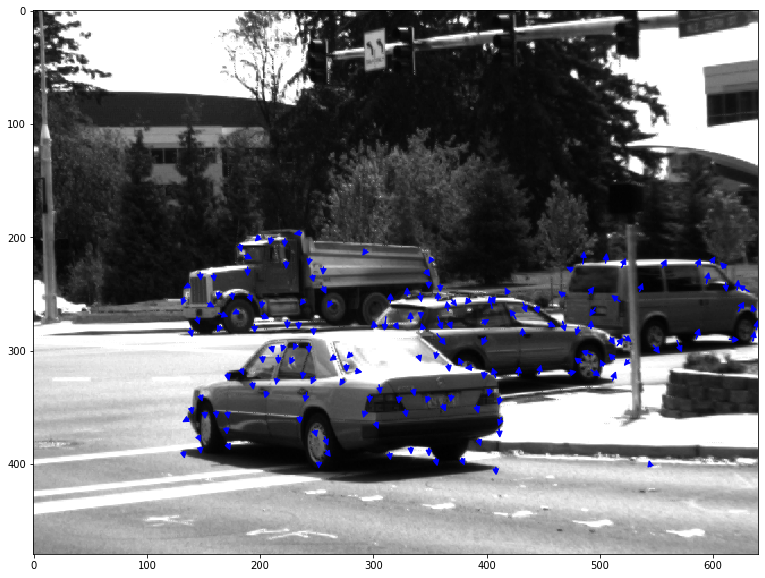

In [32]:
img1, img2 = frames("Dumptruck")
main(img1, img2)

### Segmentation from a single image
- We plot the segmentation by applying a mask and finding the pixels less than a threshold for a single image
- The magnitude of each pixel is found by the flow vectors.
-  Magnitude = u ** 2+v ** 2
- Threshold used = 0.8

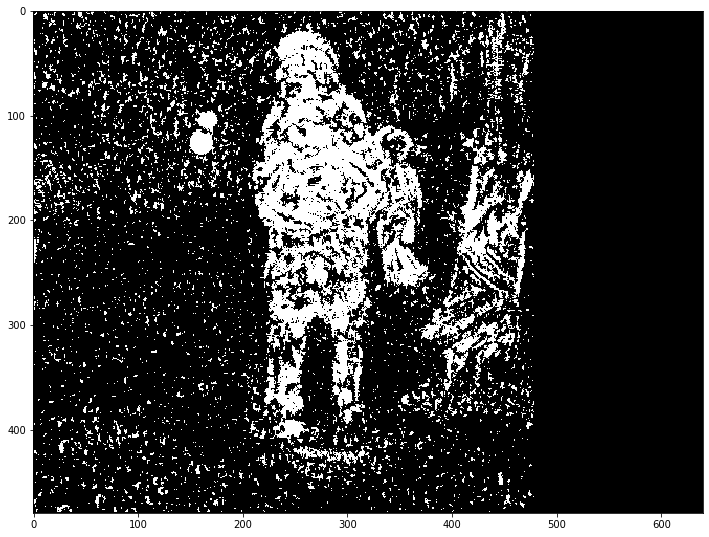

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [16]:
img1, img2 = frames()
u, v = calculate_u_v(img1, img2, wsize = 3, type_ = "dense" )
mask_segmentation(u, v, img1)

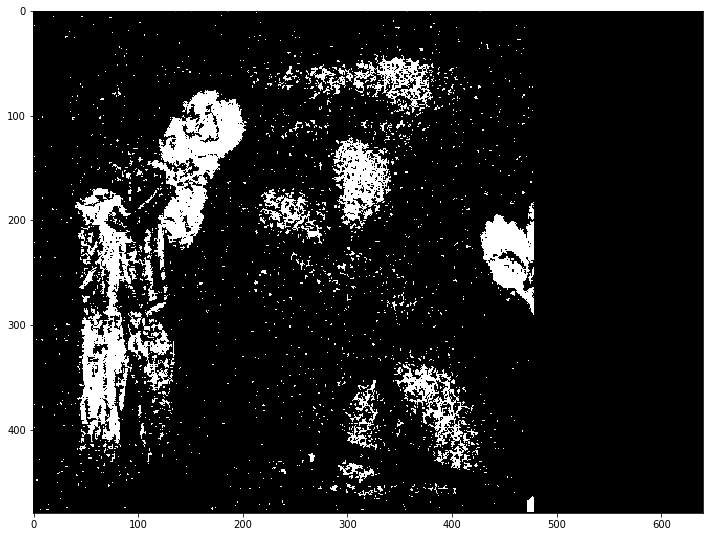

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [30]:
img1, img2 = frames("Basketball")
u, v = calculate_u_v(img1, img2, wsize = 3, type_ = "dense" )
mask_segmentation(u, v, img1)

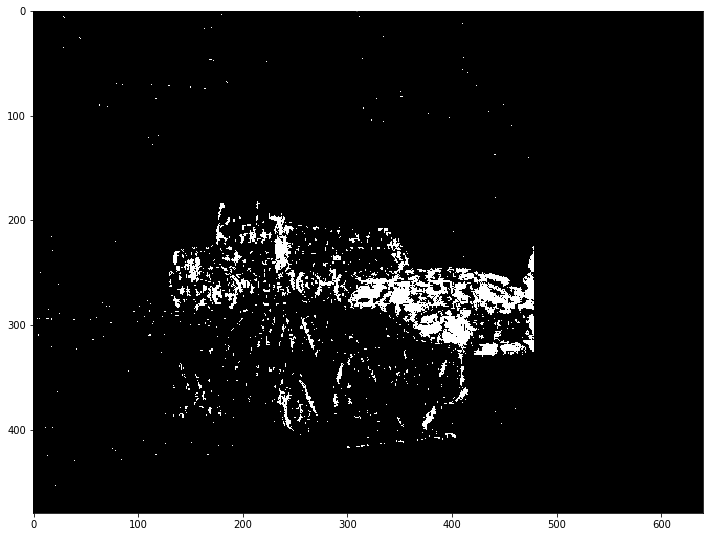

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [31]:
img1, img2 = frames("Dumptruck")
u, v = calculate_u_v(img1, img2, wsize = 3, type_ = "dense" )
mask_segmentation(u, v, img1)

### Object tracking
We do object tracking in a video scene using dense optical flow. Steps are as follow:
- Get the flow between consecutive frames of a video
- Using cv2.cartToPolar() function get the magnitude of flow
- Convert the magnitude array to hsv and apply thresholds to get the dominant areas
- Find the contours using cv2.findContours() method from the thresholded magnitude array
- Draw bounded boxes for the different countours
- In the two tests, when the motion is too fast or there is occlusion and brightness change, the contour does not give a bounding box, and there are many bounding boxes/no bounding boxes generated for that particular frame

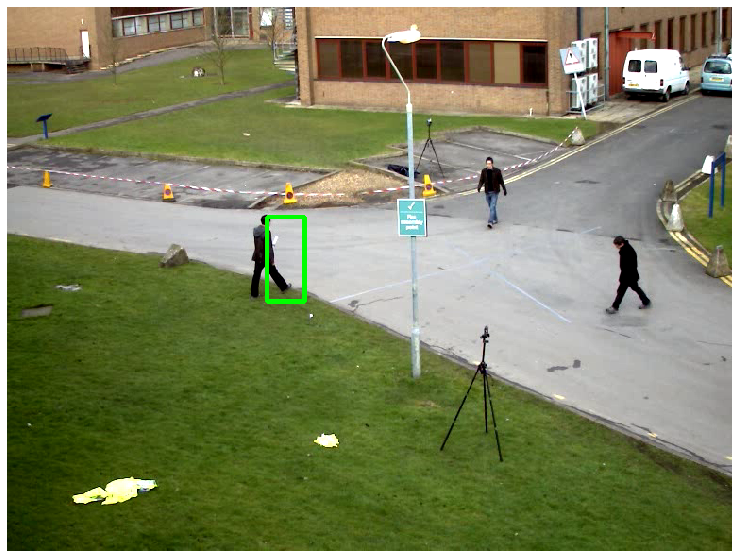

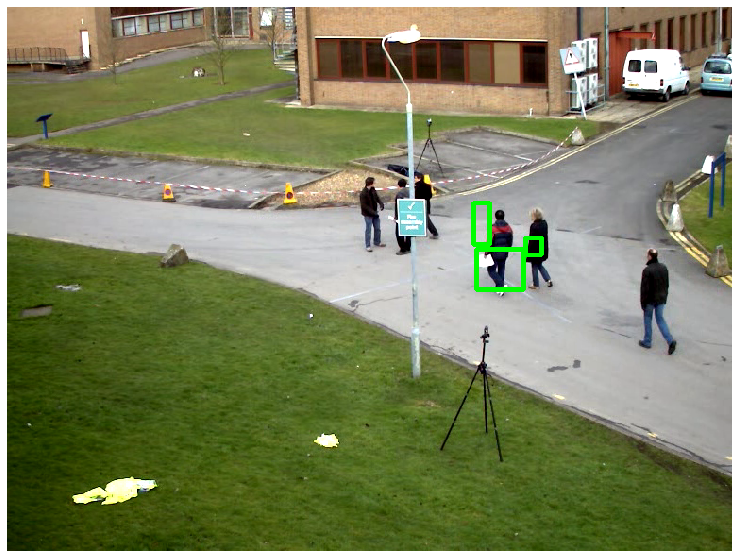

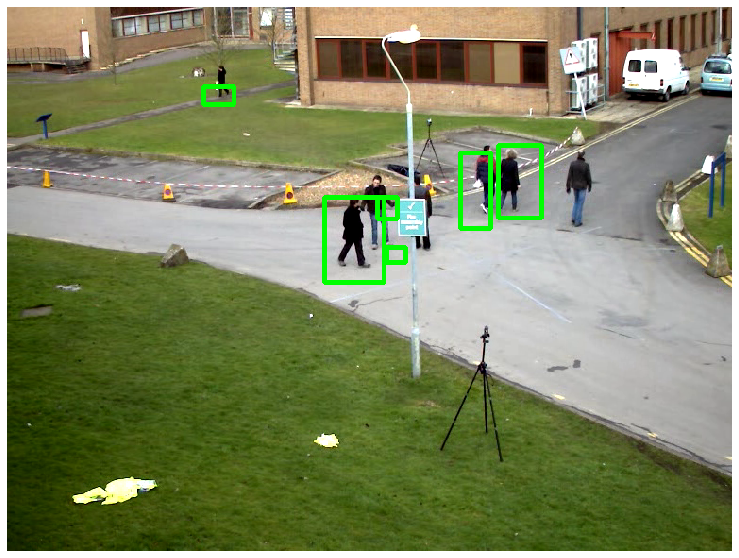

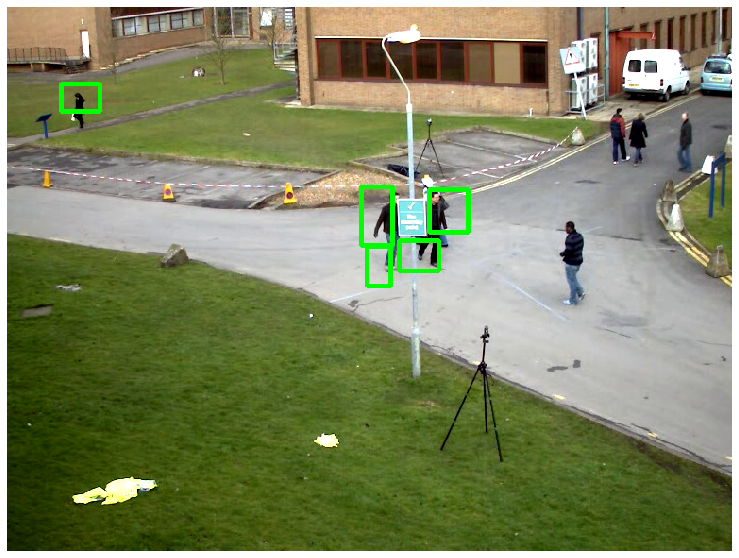

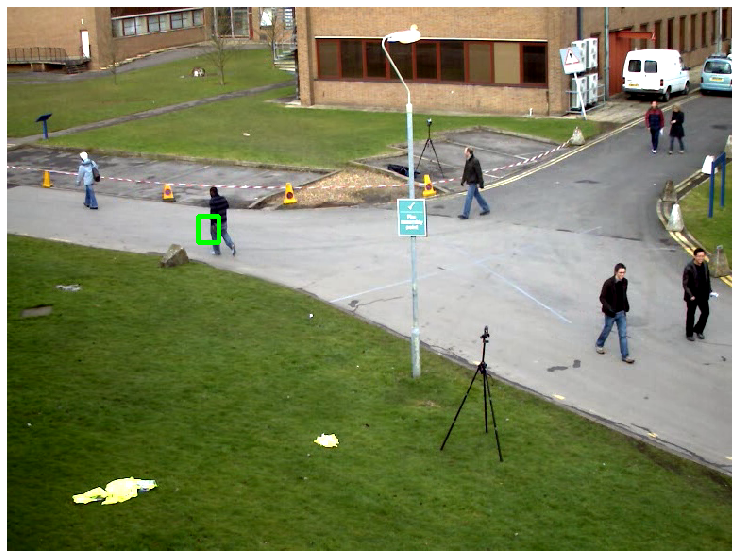

...

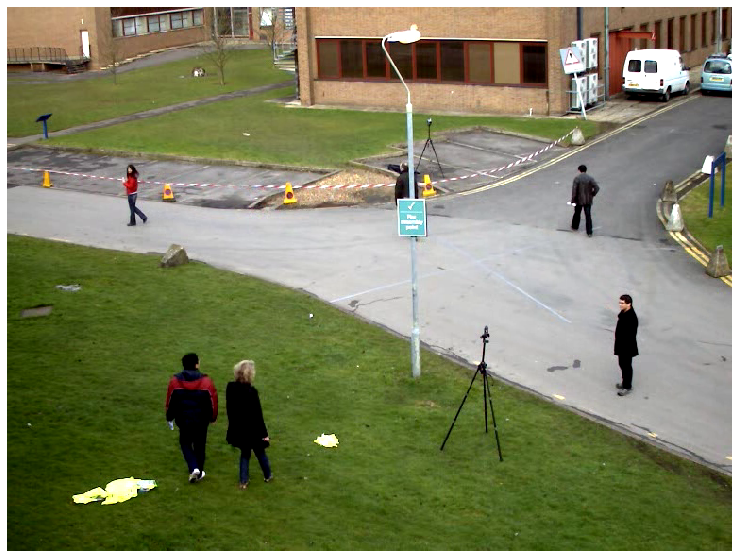

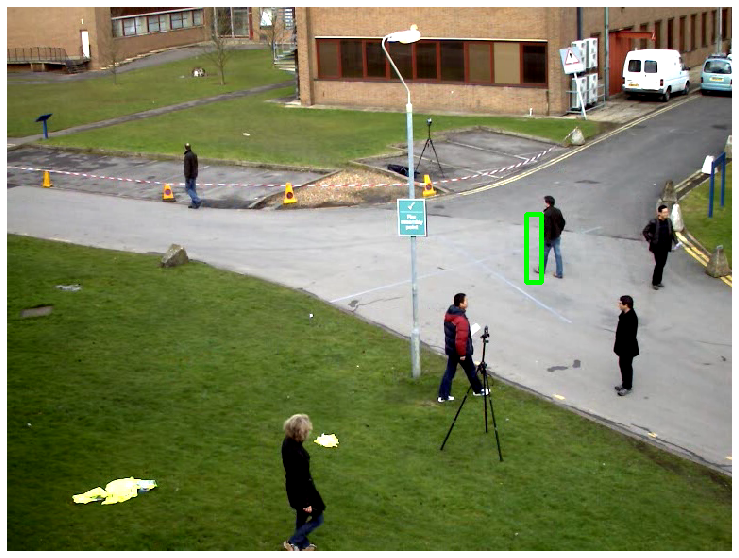

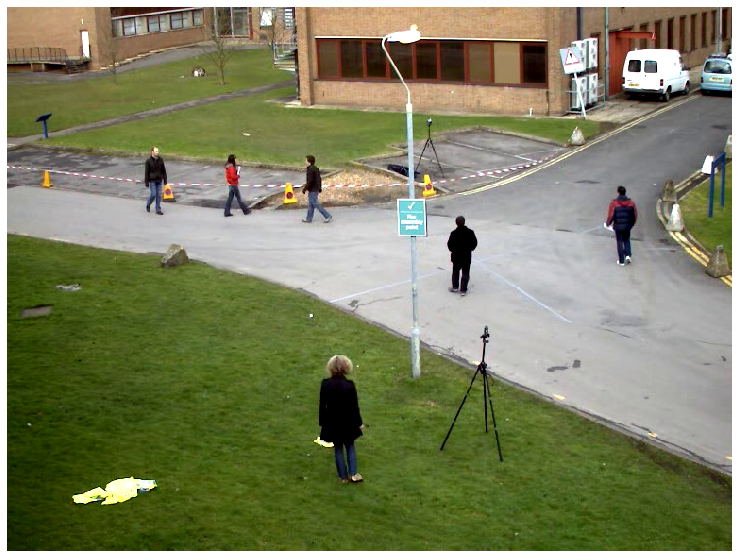

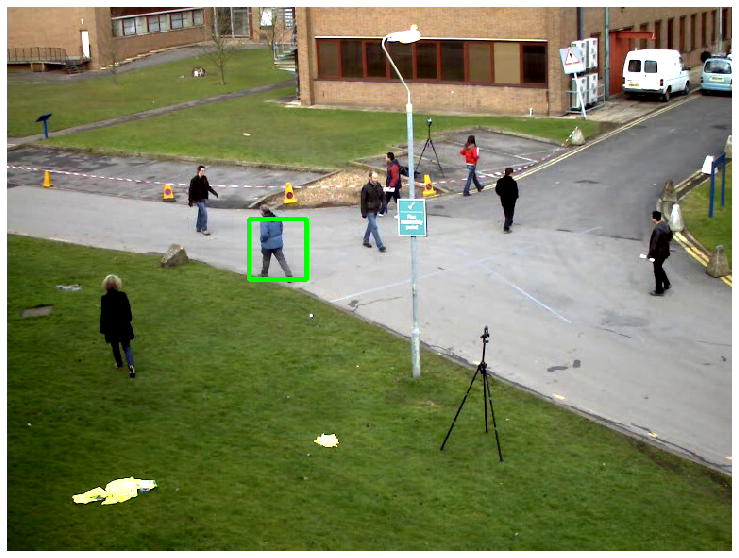

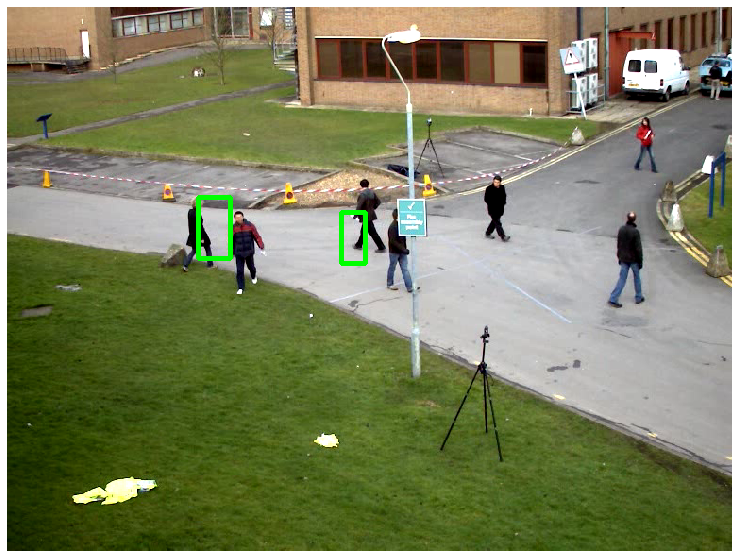

In [187]:
trackObjectsfromVid(path = "vtest.avi")

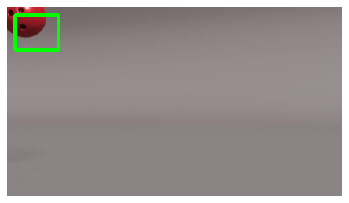

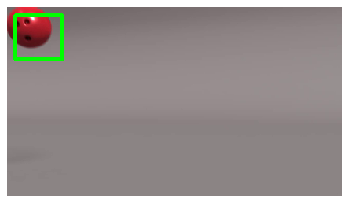

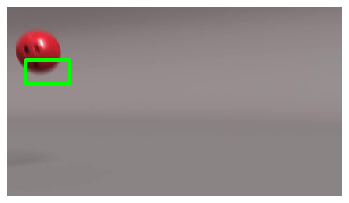

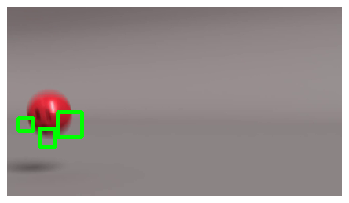

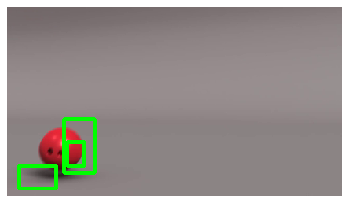

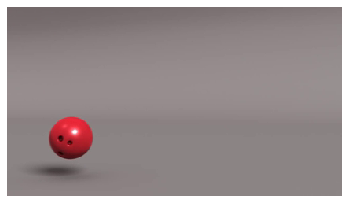

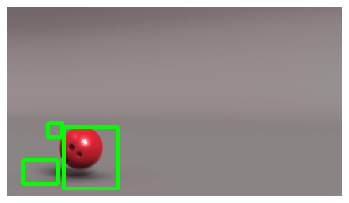

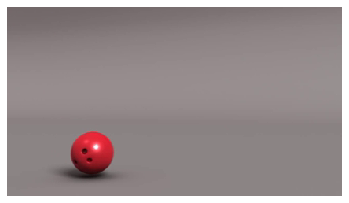

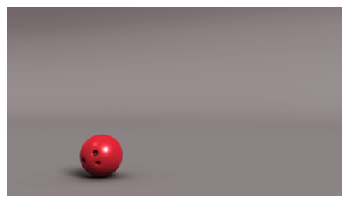

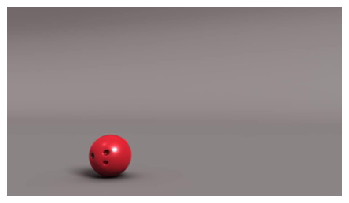

In [25]:
trackObjectsfromVid(path = "ball.mp4", out_path = "ball")

### Video segmentation 
- We do video segmentation using optical flow
- We use the mask segmentation technique to plot the segmentation
- This is done based on the flow calculated 
- In the video, the successive frames have been segmented, and the ball can be seen bouncing up and down

/home/ajay/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater
  """


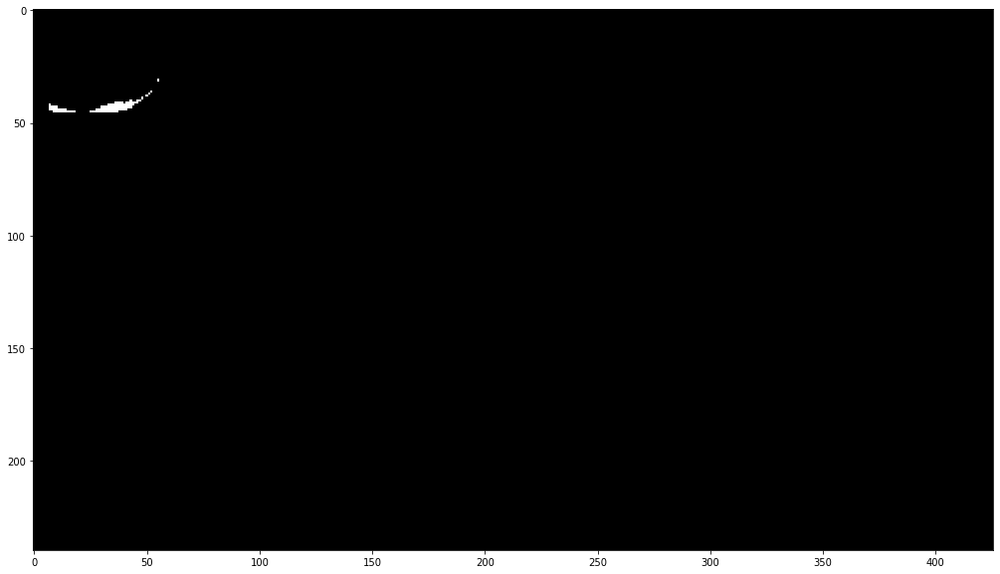

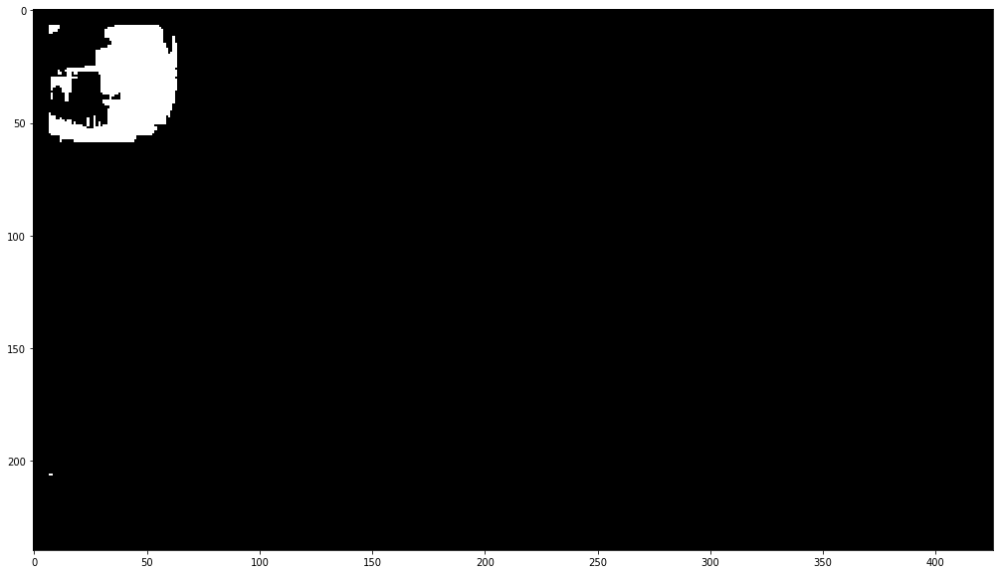

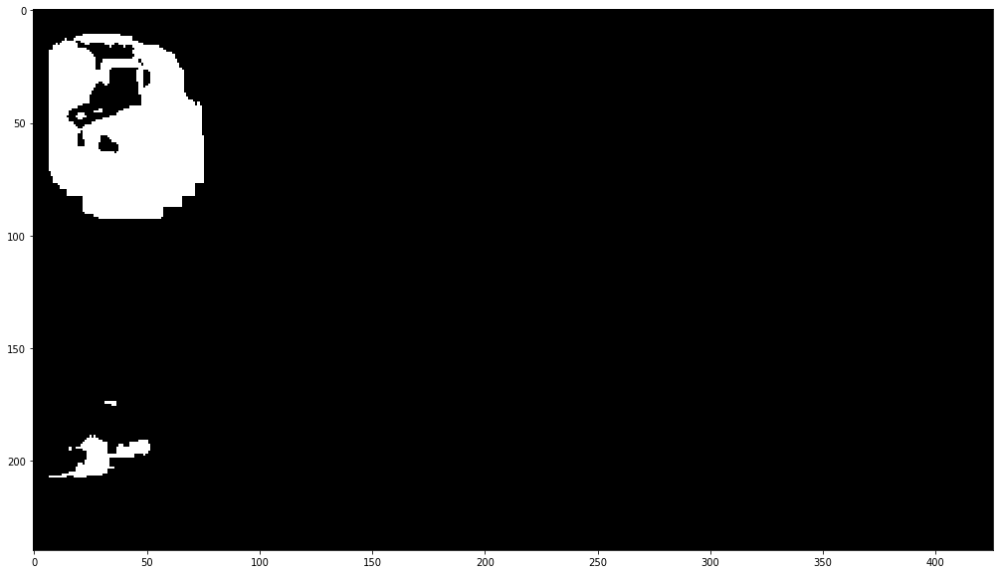

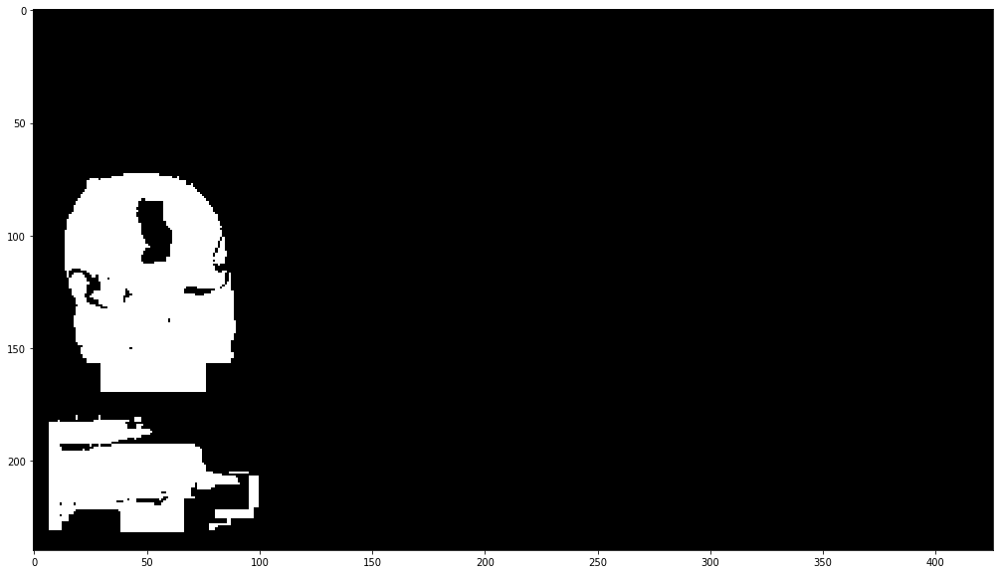

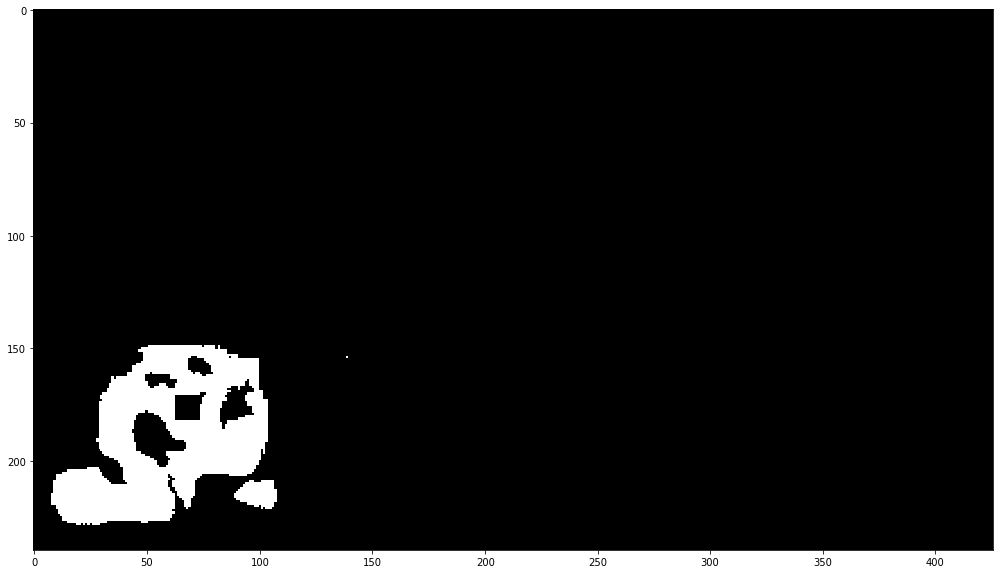

...

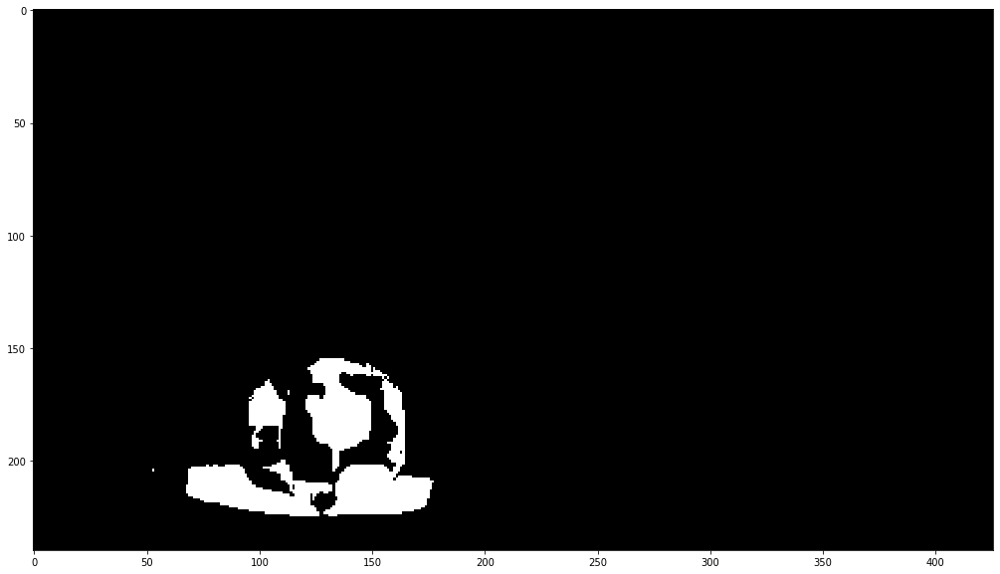

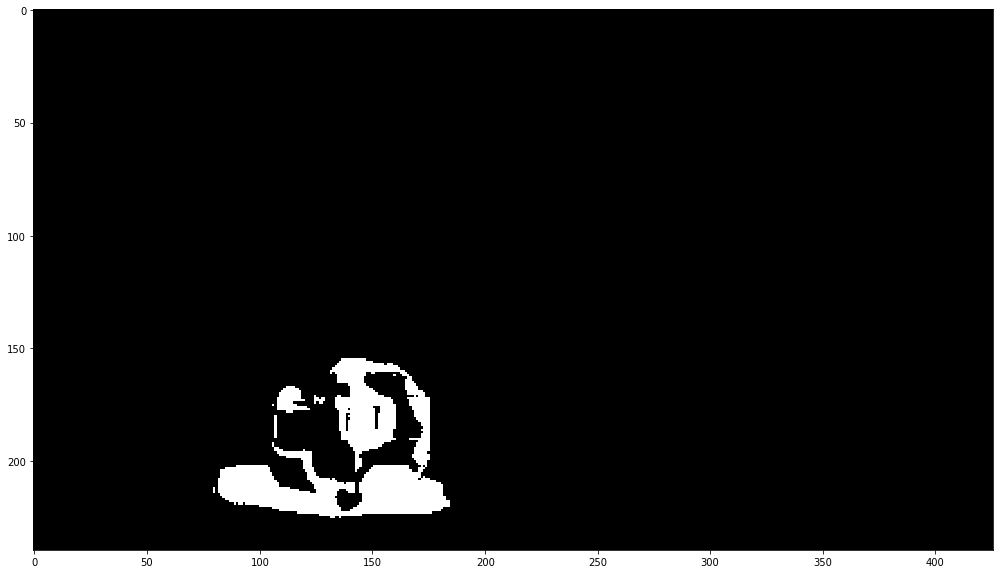

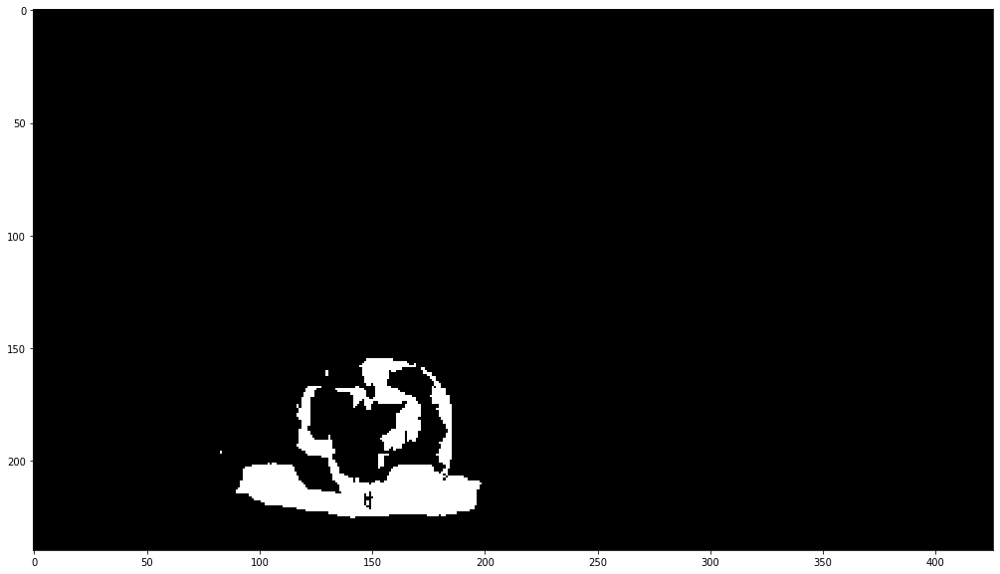

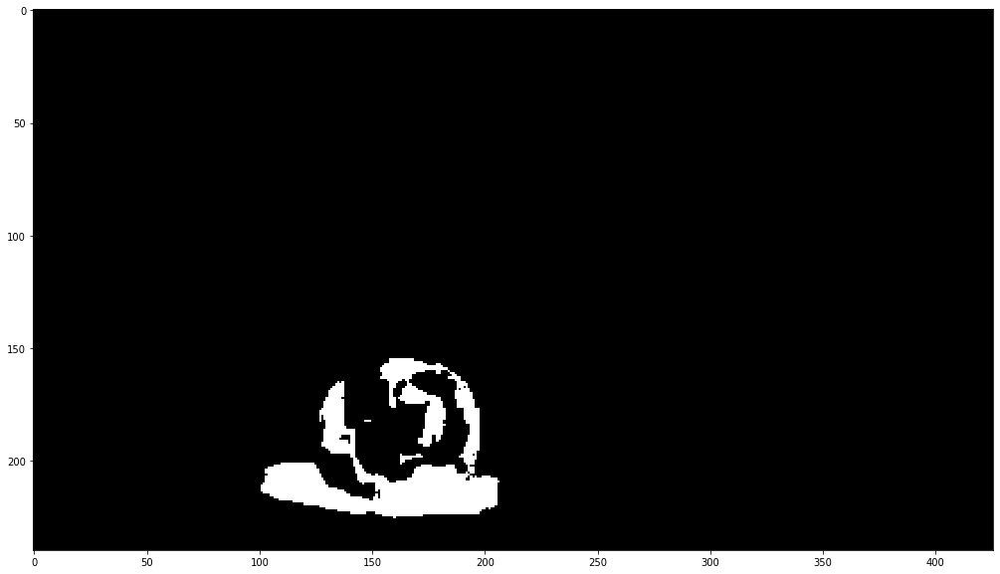

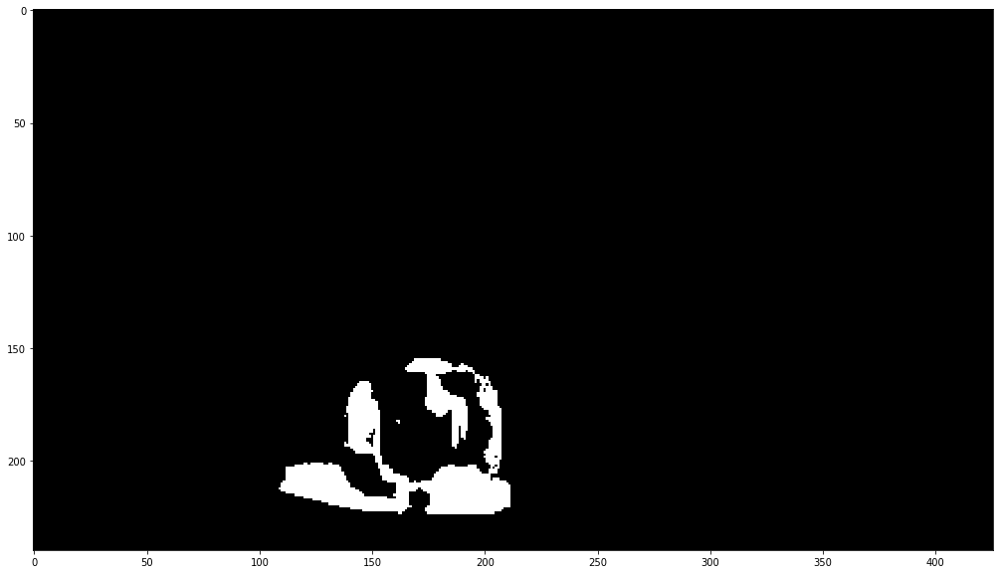

In [216]:
segment_vid(path = "ball.mp4", out_path = "ball")